<div style="border:solid green 2px; padding: 20px">
<b>Ольга, привет!</b>

Меня зовут Евгений Дащенко, и я буду проверять твой проект. Предлагаю общаться на «ты» 😊 Но если это не удобно - дай знать, и мы перейдем на "вы". 

Моя основная цель — не указать на совершенные тобою ошибки, а поделиться своим опытом и помочь тебе стать аналитиком данных. Ты уже проделал большую работу над проектом, но давай сделаем его еще лучше. Ниже ты найдешь мои комментарии - пожалуйста, не перемещай, не изменяй и не удаляй их. Я буду использовать цветовую разметку:

<div class="alert alert-danger">
<b>Критическая ошибка: ❌</b> Так выделены самые важные замечания. Без их отработки проект не будет принят. </div>

<div class="alert alert-warning">
<b>Хорошо, но можно и лучше: ❗️</b> Так выделены небольшие замечания. Одна-два таких замечания в проекте допустимы, но если их будет больше - тебе будет необходимо внести исправления. Это как тестовое задание при приеме на работу: очень много мелких ошибок могут стать причиной отказа кандидату. 

</div>

<div class="alert alert-success">
<b>Все отлично: ✅</b> Так я выделяю все остальные комментарии.</div>

Давай работать над проектом в диалоге: если ты что-то меняешь в проекте или отвечаешь на мои комменатри — пиши об этом. Мне будет легче отследить изменения, если ты выделишь свои комментарии:
<div class="alert alert-info"> <b>Комментарий студента: ℹ️</b> Например, вот так.</div>

Всё это поможет выполнить повторную проверку твоего проекта оперативнее. 

**Исследование рынка заведений общественного питания в Москве**

**Цель исследования** - найти интересные особенности рынка заведений общественного питания в Москве и презентовать полученные результаты, которые помогут инвесторам определиться в выборе вида заведения, его расположения, а также меню и цен.

**Объект исследования** - датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. /datasets/moscow_places.csv

**Ход исследования:**

1. [Шаг 1. Загрузим данные и изучим общую информацию](#шаг1)


2. [Шаг 2. Выполним предобработку данных](#шаг2)
    * [Работа с пропусками](#шаг2.1)
    * [Работа с дубликатами](#шаг2.2) 
    * [Создадим столбец street с названиями улиц из столбца с адресом](#шаг2.3) 
    * [Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)](#шаг2.4) 
    
    
3. [Шаг 3. Анализ данных](#шаг3)  
    * [Исследуем количество объектов общественного питания по категориям.](#шаг3.1)
    * [Исследуем количество посадочных мест в заведениях по категориям](#шаг3.2)
    * [Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете](#шаг3.3)
    * [Выясним, какие категории заведений чаще являются сетевыми? Исследуем данные и построим график](#шаг3.4)
    * [Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве.](#шаг3.5)
    * [Рассчитаем общее количество заведений и количество заведений каждой категории по районам](#шаг3.6)
    * [Построим распределение средних рейтингов по категориям заведений](#шаг3.7)
    * [Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района](#шаг3.8)
    * [Отобразим все заведения датасета на карте](#шаг3.9)
    * [Найдем топ-15 улиц по количеству заведений](#шаг3.10)
    * [Найдем улицы, на которых находится только один объект общепита](#шаг3.11)
    * [Рассчитаем медиану среднего чека для каждого района](#шаг3.12)
    * [Рассмотрим заведения с низким рейтингом < 3.5 по категориям и выясним, какие категории заведений оценивают чаще ниже остальных.](#шаг3.13)
    * [Вывод](#шаг3.14)
    
    
4. [Шаг 4. Детализируем исследование: открытие кофейни](#шаг4)
    * [Вывод](#шаг4.1)
    * [Рекомендации по открытию кофейни](#шаг4.2)
    

<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

Здорово, когда есть вступление в сам проект, каждый сможет быстрее разобраться в концепции / деталях работы. 

</div>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json

<div class="alert alert-info"> <b>Комментарий студента: ℹ️</b> Евгений, привет! Перенесла import библиотек в начало проекта. </div>

<a id="шаг1"></a> **Шаг 1. Загрузим данные и изучим общую информацию.** 


In [2]:
# Прочитаем файл 

data = pd.read_csv('/datasets/moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
# Посмотрим общую информацию о таблице

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
# Посчитаем количество уникальных заведений

print('Количество заведений:', data['name'].nunique())

Количество заведений: 5614


**ВЫВОД**

Общая информацию о датасете. 
- в датасете представлено 8406 заведений, из них 5614 имеют уникальные названия
- Тип значений столбцов соответствует представленной информации и не требует замены.
  - name — название заведения - object 
  - address — адрес заведения - object
  - category — категория заведения, например «кафе», «пиццерия» или «кофейня» - object
  - hours — информация о днях и часах работы - object
  - lat — широта географической точки, в которой находится заведение - float64
  - lng — долгота географической точки, в которой находится заведение - float64
  - rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0) - float64
  - price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее - object
  - avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона - object
  - middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт» - float64
  - middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино» - float64
  - chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки) - int64  
  - district — административный район, в котором находится заведение, например Центральный административный округ- object
  - seats — количество посадочных мест - float64

<a id="шаг2"></a> 
**Шаг 2. Выполним предобработку данных**

Изучим, есть ли дубликаты в данных. Поищем пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?
Выполним предобработку данных:
Создадим столбец street с названиями улиц из столбца с адресом.
Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
  
логическое значение True — если заведение работает ежедневно и круглосуточно;
логическое значение False — в противоположном случае.

<a id="шаг2.1"></a> 
**Шаг 2.1 Работа с пропусками**

In [5]:
# Проверим датафрейм на процентное содержание пропусков в каждом столбце

pd.DataFrame(round(data.isna().mean()*100,)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

Классный способ посчитать доли пропущенных значений и визуализировать их с помощью тепловой карты.
    
</div>

<a id="шаг2.2"></a> 
**Шаг 2.2 Работа с дубликатами**

In [6]:
# Проверим датасет на наличие явных дубликатов.

print ('Явных дубликатов в таблице:', data.duplicated().sum())

Явных дубликатов в таблице: 0


In [7]:
# Проверим датасет на наличие неявных дубликатов.
# Приведем названия заведений к нижнему регистру
data['name'] = data['name'].str.lower()
duplicateRows = data.duplicated(['name', 'lat', 'lng'], keep=False).sum()
print ('Неявных дубликатов в таблице:', duplicateRows)

Неявных дубликатов в таблице: 2


<a id="шаг2.3"></a> 
**Шаг 2.3 Создадим столбец street с названиями улиц из столбца с адресом.**

<div class="alert alert-warning">
<b>Комментарий ревьюера: ❗️</b>

<s>Если в проекте есть закомментированный код и он не используется в проекте, то лучше всего избавляться от него, чтобы он также не портил презентабельность проекта.
    
</div>

<div class="alert alert-info"> <b>Комментарий студента: ℹ️</b> Закомментированный код удалила. </div>

In [8]:
# Создадим столбец street с названиями улиц из столбца с адресом. 

data['street'] = data['address'].str.split(",").str.get(1)

# data.head()

<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

Оставил пример ниже, как можно написать такой подход немного по-другому.
    
</div>

```python
data['address'].str.split(', ').str[1]
```

<div class="alert alert-info"> <b>Комментарий студента: ℹ️</b> Принято, спасибо! </div>

<a id="шаг2.4"></a> 
**Шаг 2.4 Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)**

In [9]:
print(data['price'].unique())
print(data['hours'].unique)

[nan 'выше среднего' 'средние' 'высокие' 'низкие']
<bound method Series.unique of 0                                  ежедневно, 10:00–22:00
1                                  ежедневно, 10:00–22:00
2       пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...
3                                  ежедневно, 09:00–22:00
4                                  ежедневно, 10:00–22:00
                              ...                        
8401                               ежедневно, 09:00–02:00
8402                               ежедневно, 08:00–22:00
8403                             ежедневно, круглосуточно
8404                             ежедневно, круглосуточно
8405                             ежедневно, круглосуточно
Name: hours, Length: 8406, dtype: object>


In [10]:
# Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
# логическое значение True — если заведение работает ежедневно и круглосуточно; логическое значение False — в противоположном случае.

data['is_24/7'] = data['hours'] == 'ежедневно, круглосуточно'
# data.head()

<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

Хороший способ разметить данные внутри датасета. Оставил пример ниже более явного подхода в использовании.
    
</div>

```python
data['hours'].str.contains('ежедневно, круглосуточно')

```

<div class="alert alert-info"> <b>Комментарий студента: ℹ️</b> Спасибо! </div>

**ВЫВОД**

- В изучаемом датасете процентное содержание пропусков в следующих столбцах составляет:
   - hours	- 6 %
   - price	- 61 %
   - avg_bill - 55 %
   - middle_avg_bill - 63 %
   - middle_coffee_cup -	94 %
   - seats -	43 %

- столбцы hours, price, avg_bill имеют строковый тип данных, заполнить в них пропуски корректно не получится.
- столбцы middle_avg_bill, middle_coffee_cup, seats имеют вещественный тип данных. В дальнейшем для расчётов столбец middle_coffee_cup не потребуется. А данных в столбцах middle_avg_bill и seats достаточно. 37% это достаточно много данных, чтобы составить общую картину. На самом деле для каждого района достаточно от 50 до 100 наблюдений, чтобы посчитать адекватную оценку медианы и среднего.
- Создали столбец street с названиями улиц из столбца с адресом.
- Создали столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)


<a id="шаг3"></a> 
**Шаг 3. Анализ данных.** 


<a id="шаг3.1"></a>
**3.1 Исследуем количество объектов общественного питания по категориям.**

Выясним, какие категории заведений представлены в данных. Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Ответим на вопрос о распределении заведений по категориям.**

In [11]:
#data_category = data.groupby('category')['name'].count().reset_index().sort_values(by='name', ascending=False).\
#rename(columns={'name': 'category_count'})
#data_category

data_category = data['category'].value_counts().reset_index()
data_category.columns = ['category', 'category_count']
data_category

,category,category_count
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [12]:
# Строим круговую диаграмму

fig = px.pie(data_category, values='category_count', names='category', title='Соотношение объектов общественного питания по категориям')
fig.show() 

**ВЫВОД**

- Больше всего в Москве кафе 28.3 % и ресторанов 24.3%, что в сумме составляет более 50 %.
- Меньше всего столовых 3.75 % и булочных 3.05 %.

<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

Отличный и наглядный график 👍
    
Здорово, когда он подписан. Так быстрее понять о чем идёт речь на нём.
    
</div>

<a id="шаг3.2"></a>
**3.2 Исследуем количество посадочных мест в заведениях по категориям** 

Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Проанализируем результаты и сделаем выводы.

In [13]:
# Исследуем количество посадочных мест на наличие аномальных значений.

data.groupby('category')['seats'].describe().round()

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",468.0,125.0,145.0,0.0,48.0,82.0,150.0,1288.0
булочная,148.0,89.0,98.0,0.0,25.0,50.0,120.0,625.0
быстрое питание,349.0,99.0,107.0,0.0,28.0,65.0,140.0,1040.0
кафе,1218.0,98.0,118.0,0.0,35.0,60.0,120.0,1288.0
кофейня,751.0,111.0,128.0,0.0,40.0,80.0,144.0,1288.0
пиццерия,427.0,94.0,112.0,0.0,30.0,55.0,120.0,1288.0
ресторан,1270.0,122.0,124.0,0.0,48.0,86.0,150.0,1288.0
столовая,164.0,100.0,123.0,0.0,40.0,76.0,117.0,1200.0


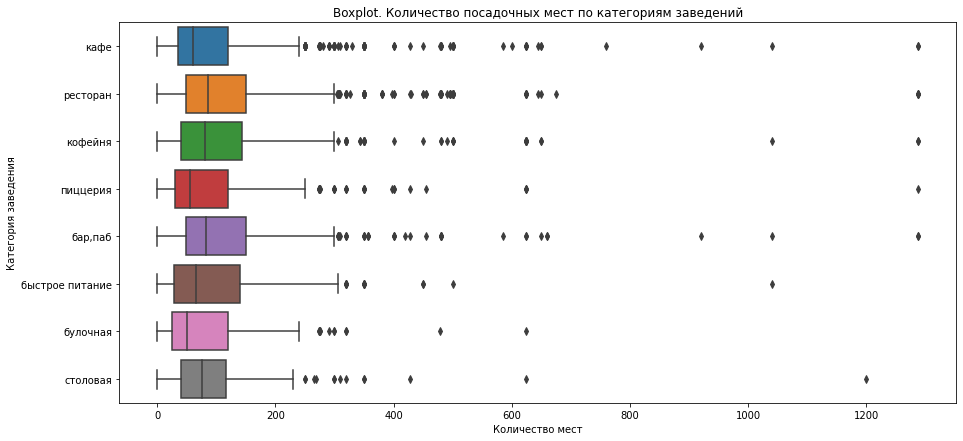

In [14]:
plt.figure(figsize=(15, 7))
ax = sns.boxplot(data=data, x='seats', y='category')

plt.title('Boxplot. Количество посадочных мест по категориям заведений')
plt.xlabel('Количество мест')
plt.ylabel('Категория заведения')
plt.show()

Количество посадочных мест более 300 предлагаю считать "выбросами", так как заведения с большим количеством мпосадочных мест встречаются редко.

<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

Отличный способ визуализировать разброс данных по каждому типу заведения 👍
    
Кстати мы можем использовать параметр `showfliers=False`, чтобы убрать выбросы с графика.
    
</div>

<div class="alert alert-info"> <b>Комментарий студента: ℹ️</b> Поняла на будущее, спасибо! </div>

In [15]:
# Рассчитаем медианное значение количества мест, чтобы "выбросы" не оказывали существенного влияния на полученный результат.

seats_median = data.groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending=False)
print(seats_median)

          category  seats
6         ресторан   86.0
0          бар,паб   82.5
4          кофейня   80.0
7         столовая   75.5
2  быстрое питание   65.0
3             кафе   60.0
5         пиццерия   55.0
1         булочная   50.0


In [16]:
def fig_bar(name, x_name, y_name, color_name, text, orientation, title_name, xaxis_title_name, yaxis_title_name): 

    fig = px.bar(name, 
                 x = x_name, 
                 y = y_name, 
                 color = color_name,
                 text = text,
                 orientation=orientation
                 )
    fig.update_xaxes(tickangle=45)
            
# оформляем график
    fig.update_layout(title = title_name,
                      xaxis_title = xaxis_title_name,
                      yaxis_title = yaxis_title_name,
                      yaxis={'categoryorder':'total ascending'},
                      width=1000,
                      height=500,
                      showlegend = False)
    fig.show() # выводим график

In [17]:
fig_bar(seats_median, 'category', 'seats','category','seats', 'v', 'Медианное количество мест в зависимости от категории заведения', \
        'Категория заведения', 'Количество посадочных мест')

<div class="alert alert-info"> <b>Комментарий студента: ℹ️</b> Заменила на функцию и убрала легенду, чтобы график не выглядел загруженным. </div>

<div class="alert alert-success">
<b>Комментарий ревьюера (2): ✅</b>

🔥🔥🔥    
    
</div>

**ВЫВОД**

- Количество посадочных мест более 300 будем считать "выбросами".
- Наибольшее значение медианы посадочных мест в ресторанах и барах.
- Наименьшее значение в пиццериях и булочных. 


<a id="шаг3.3"></a>
**3.3 Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.** 

Выясним, каких заведений больше.

In [18]:
# 0 — заведение не является сетевым
# 1 — заведение является сетевым

# Заменим в датасете 0 на "сетевое", 1 на "несетевое"

data.loc[(data.chain == 0), 'chain'] = "несетевое"
data.loc[(data.chain == 1), 'chain'] = "сетевое"

data_catering = data['chain'].value_counts().reset_index()
data_catering.columns = ['chain', 'chain_count']

data_catering

,chain,chain_count
0,несетевое,5201
1,сетевое,3205


In [19]:
# Строим круговую диаграмму

fig = px.pie(data_catering, names='chain', values='chain_count', title='Соотношение сетевых и несетевых объектов общественного питания')

fig.show() 

**ВЫВОД**

Несетевых заведений почти в 2 раза больше, чем сетевых

<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

На первый взгляд так и не скажешь, что несетевых объектов больше. 
    
Хорошо, что подтвердили это с помощью наших данных.
    
</div>

<a id="шаг3.4"></a>
**3.4 Выясним, какие категории заведений чаще являются сетевыми? Исследуем данные и построим график.**

In [20]:
# Расчитаем по категориям количество сетевых и несетевых ООП.

data_seat = data.pivot_table(index = 'category', columns='chain', values='name', aggfunc='count')
data_seat

chain,несетевое,сетевое
category,,
"бар,паб",596,169
булочная,99,157
быстрое питание,371,232
кафе,1599,779
кофейня,693,720
пиццерия,303,330
ресторан,1313,730
столовая,227,88


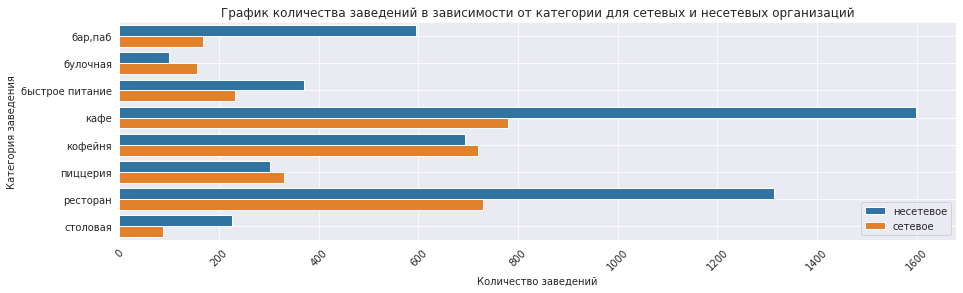

In [21]:
data_seat = data.groupby(['category', 'chain'], as_index = False)[['name']].count()
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# назначаем размер графика
plt.figure(figsize=(15, 4))
# строим столбчатый график средствами seaborn
sns.barplot(x='name', y='category', data=data_seat, hue='chain')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График количества заведений в зависимости от категории для сетевых и несетевых организаций')
plt.xlabel('Количество заведений')
plt.ylabel('Категория заведения')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show();


**ВЫВОД**

- Среди таих категорий заведений, как бары, быстрое питание, кафе, рестораны и даже столовые преобладают несетевые организации.
- В то время, как среди булочных, кофеин и пццерий преобладают, наоборот, сетевые заведения.


<a id="шаг3.5"></a>
**3.5 Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве.**

Сгруппируем данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Построим подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [22]:
# Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве

data_chain = data.query('chain == "сетевое"').groupby('name').agg({'category' : pd.Series.mode, 'address' : 'count'}).\
sort_values(by = 'address', ascending=False).reset_index()
data_chain = data_chain.rename(columns={'address':'count'})
data_chain.head(15)

,name,category,count
0,шоколадница,кофейня,120
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,50
7,хинкальная,кафе,44
8,кофепорт,кофейня,42
9,кулинарная лавка братьев караваевых,кафе,39


In [23]:
# строим столбчатую диаграмму 

fig_bar(data_chain.head(15), 'name', 'count','name', 'count', 'v', 'ТОП-15 популярных сетей в Москве', 'Название сети',\
        'Количество заведений')

**ВЫВОД**

- Организация с наибольшим числом заведений 120 - кофейня "Шоколадница"
- Меньше всего заведений 27 в топ-15 в кафе Му-Му 
- Все эти заведения объединяет то, что они популярны и известны жителям Москвы.

<div class="alert alert-warning">
<b>Комментарий ревьюера: ❗️</b>

<s>Мы получается дублируем информацию оси X и подписи самих значений. Рекомендую оставить что-то одно, чтобы облегчить график.
    
</div>

<div class="alert alert-info"> <b>Комментарий студента: ℹ️</b> Исправила на столбчатых диаграммах. </div>

<a id="шаг3.6"></a>
**3.6  Рассчитаем общее количество заведений и количество заведений каждой категории по районам.**

Какие административные районы Москвы присутствуют в датасете? Отобразим общее количество заведений и количество заведений каждой категории по районам. Проиллюстрируем эту информацию одним графиком.

In [24]:
# data.head()

In [25]:
# Определим административные районы Москвы

data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [26]:
# Общее количество заведений в Москве

print('Общее количество заведений в Москве', data['name'].count())

Общее количество заведений в Москве 8406


In [27]:
# Отобразим общее количество заведений по районам.

data_district_total = data.groupby('district', as_index = False).agg({'name': 'count'}).sort_values(by = 'name', \
                                                                                                    ascending=False)
data_district_total = data_district_total.rename(columns={'name':'count'})
data_district_total

,district,count
5,Центральный административный округ,2242
2,Северный административный округ,900
8,Южный административный округ,892
3,Северо-Восточный административный округ,891
1,Западный административный округ,851
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


In [28]:
# Отобразим количество заведений каждой категории по районам.

data_district = data.groupby(['district','category'], as_index = False).agg({'name': 'count'})
data_district = data_district.rename(columns={'name':'count'})
data_district

,district,category,count
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105
...,...,...,...
67,Южный административный округ,кафе,264
68,Южный административный округ,кофейня,131
69,Южный административный округ,пиццерия,73
70,Южный административный округ,ресторан,202


In [29]:
# строим столбчатую диаграмму 

fig = px.bar(data_district, # загружаем данные и заново их сортируем
             x = 'count', # указываем столбец с данными для оси X
             y = 'district', # указываем столбец с данными для оси Y
             color = 'category',
             text = 'count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Количество заведений каждой категории по районам',
                  xaxis_title='Количество заведений',
                  yaxis_title='Район Москвы',
                  yaxis={'categoryorder':'total ascending'}, # разместим столбцы по убыванию для удобства восприятия
                  width=1000,
                  height=500)
fig.show() # выводим график

**ВЫВОД**

- Больше всего заведений расположено в Центральном административном округе. Тут больше всего баров, кафе, кофеин и ресторанов.
- Меньше всего заведения в Северо-западном административном округе.
- В остальных районах количество заведений находится примерно на одинаковом уровне. Здесь преобладают кафе, кофейни и рестораны.

<a id="шаг3.7"></a>
**3.7 Построим распределение средних рейтингов по категориям заведений.** 

Визуализируем распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [30]:
# Исследуем рейтинги на наличие аномальных значений.

data.groupby('category')['rating'].describe().round()

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",765.0,4.0,0.0,1.0,4.0,4.0,5.0,5.0
булочная,256.0,4.0,0.0,1.0,4.0,4.0,4.0,5.0
быстрое питание,603.0,4.0,1.0,1.0,4.0,4.0,4.0,5.0
кафе,2378.0,4.0,1.0,1.0,4.0,4.0,4.0,5.0
кофейня,1413.0,4.0,0.0,1.0,4.0,4.0,4.0,5.0
пиццерия,633.0,4.0,0.0,1.0,4.0,4.0,4.0,5.0
ресторан,2043.0,4.0,0.0,1.0,4.0,4.0,4.0,5.0
столовая,315.0,4.0,0.0,1.0,4.0,4.0,4.0,5.0


Аномальных значений среди рейтингов не выявлено.


In [31]:
# Рассчитаем средний рейтинг по категориям заведений

rating_cat_avg = data.groupby('category').agg({'rating': 'mean'}).sort_values(by='rating', ascending=False)\
.round(2).reset_index()
rating_cat_avg = rating_cat_avg.rename(columns={'rating':'rating_avg'})
rating_cat_avg

,category,rating_avg
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [32]:
# строим столбчатую диаграмму 

fig_bar(rating_cat_avg, 'category', 'rating_avg','category', 'rating_avg', 'v', 'Средний рейтинг по категориям заведений в Москве',\
        'Категория заведения', 'Средний рейтинг заведения')

**ВЫВОД**

- Визуально понятно, что средний рейтинг разных категорий заведений примерно одинаковый.
- Максимальные ср. рейтинг у баров/пабов 4.39, минимальный - у заведений быстрого питания 4.05


<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

Хорошим тоном считается показывать значения на графиках. 
    
Кстати это можно сделать с помощью:
    
- в бибилотеке `plotly` с помощью атрибута `text`, например в методе `px.bar`
- в библиотеке `matplotlib` <a href="https://queirozf.com/entries/add-labels-and-text-to-matplotlib-plots-annotation-examples">первый пример</a>, <a href="https://matplotlib.org/stable/gallery/lines_bars_and_markers/barchart.html">второй пример</a> для группированных графиков
    
- в библиотеке `seaborn` [тут](https://stackoverflow.com/questions/43214978/how-to-display-custom-values-on-a-bar-plot) и [тут](https://www.statology.org/seaborn-barplot-show-values/)
    
</div>

<div class="alert alert-info"> <b>Комментарий студента: ℹ️</b> Добавилам значения на графики, так действительно нагляднее ) </div>

<div class="alert alert-success">
<b>Комментарий ревьюера (2): ✅</b>

🔥🔥🔥   
    
    
</div>

<a id="шаг3.8"></a>
**3.8 Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района** 


In [33]:
rating_distr_avg = data.groupby('district').agg({'rating' : 'mean'}).sort_values(by='rating', ascending=False)\
.round(2).reset_index()
rating_distr_avg = rating_distr_avg.rename(columns={'rating':'rating_avg'})
rating_distr_avg

,district,rating_avg
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Южный административный округ,4.18
4,Западный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


In [34]:
# строим столбчатую диаграмму 

fig_bar(rating_distr_avg, 'district', 'rating_avg','district', 'rating_avg', 'v', \
        'Средний рейтинг заведений по районам Москвы', \
        'Район Москвы', 'Средний рейтинг заведения')

In [35]:
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

# print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

<div class="alert alert-warning">
<b>Комментарий ревьюера: ❗️</b>

<s>Лучше всего импортировать все необходимые библиотеки в самом начале проекта. 
    
Это общепринятый формат в программировании, ведь так проще понять какие пакеты будут использованы в нашей работе.
    
</div>

<div class="alert alert-info"> <b>Комментарий студента: ℹ️</b> Импортировала библиотеки в начало проекта. Лишний импорт убрала. </div>

In [36]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_distr_avg,
    columns=['district', 'rating_avg'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**ВЫВОД**

- Средний рейтинг разных категорий заведений по районам Москвы составляет от 4.1 в Юго-Восточном административном округе до 4.4 в Центральном административном округе.		.
- Построили хороплет, на котором визуально видна разница между средним рейтингом заведений в зависимости от района Москвы, чем темнее оттенок, тем выше рейтинг; чем светлее - тем ниже.

<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

Рад, что получилось визуализировать данные на карте, ведь так быстрее разобраться какая ситуация в каком округе в зависимости от показателя.   
</div>

<a id="шаг3.9"></a>
**3.9 Отобразим все заведения датасета на карте.**

<div class="alert alert-warning">
<b>Комментарий ревьюера: ❗️</b>

Получается импортируем одинаковые зависимости несколько раз.
    
</div>

In [37]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

Супер 👍, кластеры то что нужно, т.к. не сильно нагружают график из-за своей сгруппированности. Если убрать кластеры, то тетрадка будет работать тяжело из-за отображения буквально каждой точки на карте.
    
</div>

<a id="шаг3.10"></a>
**3.10 Найдем топ-15 улиц по количеству заведений.**

Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам. 

In [38]:
# Сгруппируем данные по названиям улиц и найдем топ-15 улиц по количеству заведений.
data_street_top = data.groupby('street').agg({'name' : 'count'}).sort_values(by = 'name', ascending=False).reset_index()
data_street_top = data_street_top.rename(columns={'name':'name_count'})
data_street_top = data_street_top.head(15)
data_street_top

,street,name_count
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [39]:
# Сгруппируем данные по названиям улиц и по категории заведений для топ-15 улиц.

#data_street_cat_top = data.loc[data['street'].isin(data_street_top['street'])] \
data_street_cat_top = data.groupby(['street', 'category']).agg({'name' : 'count'}).reset_index() 
data_street_cat_top = data_street_cat_top.loc[data_street_cat_top['street'].isin(data_street_top['street'])] 

data_street_cat_top = data_street_cat_top.rename(columns={'name':'name_count'})

data_street_cat_top

,street,category,name_count
683,Варшавское шоссе,"бар,паб",6
684,Варшавское шоссе,быстрое питание,7
685,Варшавское шоссе,кафе,18
686,Варшавское шоссе,кофейня,14
687,Варшавское шоссе,пиццерия,4
...,...,...,...
3434,улица Миклухо-Маклая,быстрое питание,4
3435,улица Миклухо-Маклая,кафе,21
3436,улица Миклухо-Маклая,кофейня,4
3437,улица Миклухо-Маклая,пиццерия,2


In [40]:
# строим столбчатую диаграмму 

fig = px.bar(data_street_cat_top, # загружаем данные и заново их сортируем
#sort_values(by = 'name_count', ascending=False)
             x = 'name_count', # указываем столбец с данными для оси X
             y = 'street', # указываем столбец с данными для оси Y
             color = 'category',
             text = 'name_count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Количество заведений каждой категории по улицам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Топ-15 улиц Москвы',
                   yaxis={'categoryorder':'total ascending'}, # разместим столбцы по убыванию для удобства восприятия
                   width=1000,
                   height=600)
fig.show() # выводим график

**ВЫВОД**

- Самое большое число заведений расположено на Проспекте Мира
- На топ-15 улицах наиболее популярны кафе, кофейни и рестораны.
- На МКАДе ресторанов меньше всего, тут популярны кафе и точки быстрго питания.

<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>
    
Вопрос со **"звездочкой"** 😊:

Как ты считаешь это тот самый топ который нам нужен ? 
    
То есть возможно это улицы такие большие и поэтому в них большое количестов объектов питания ? 
    
</div>

<div class="alert alert-info"> <b>Комментарий студента: ℹ️</b> Ну, может ради объективности, надо рассчитывать среднее количество заведений на км. улицы, например.  </div>

<div class="alert alert-success">
<b>Комментарий ревьюера (2): ✅</b>

В точку! Именно это и хотел от тебя услышать. Естественно это дискуссионный вопрос и здесь нет правильного ответа, потому что этот вопрос может превратиться в отдельное исследование 😊    
    
    
</div>

<a id="шаг3.11"></a>
**3.11 Найдем улицы, на которых находится только один объект общепита.**

In [41]:
data_street_top_one = (data.groupby('street').agg({'name' : 'count'}).sort_values(by = 'name', ascending=True).reset_index()) \
.query('name ==1')
data_street_top_one = data_street_top_one.rename(columns={'name':'name_count'})
data_street_top_one

,street,name_count
0,1-й Автозаводский проезд,1
1,Одинцовская улица,1
2,Октябрьский переулок,1
3,Ордынский тупик,1
4,Оренбургская улица,1
...,...,...
453,3-й Хорошёвский проезд,1
454,Бобров переулок,1
455,Богословский переулок,1
456,4-й Лесной переулок,1


**ВЫВОД**

- В Москве существует 458 улиц, на которых находится всего лишь одно заведение

<a id="шаг3.12"></a>
**3.12  Рассчитаем медиану среднего чека для каждого района.**

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района. Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [42]:
# Исследуем средний чек на наличие аномальных значений.

data.groupby('category')['middle_avg_bill'].describe().round()

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",349.0,1339.0,886.0,150.0,925.0,1250.0,1750.0,11000.0
булочная,53.0,659.0,599.0,50.0,285.0,450.0,750.0,2500.0
быстрое питание,237.0,446.0,456.0,30.0,275.0,375.0,500.0,5500.0
кафе,694.0,708.0,505.0,67.0,350.0,550.0,1000.0,4500.0
кофейня,200.0,614.0,501.0,0.0,300.0,400.0,750.0,2500.0
пиццерия,395.0,789.0,518.0,150.0,424.0,600.0,1000.0,3000.0
ресторан,1040.0,1368.0,1415.0,120.0,669.0,1250.0,1750.0,35000.0
столовая,181.0,335.0,289.0,125.0,250.0,300.0,330.0,3750.0


Аномальные значения среди средних чеков не выявлены. 

In [43]:
# Рассчитаем медианное значение среди средних чеков по районам Москвы.

bill_avg = data.groupby('district').agg({'middle_avg_bill' : 'median'}).sort_values(by='middle_avg_bill', ascending=False)\
.round(2).reset_index()
bill_avg = bill_avg.rename(columns={'middle_avg_bill':'bill_median'})
bill_avg

,district,bill_median
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [44]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=bill_avg ,
    columns=['district', 'bill_median'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медиана счетов заведений по районам Москвы',
).add_to(m)

# выводим карту
m

**ВЫВОД**

- Наибольшее значение медианы счёта наблюдается в центральном и западном административных округах.
- В остальных округах медиана счёта ниже на 30-55%.
- Наименьшее значение медианы счёта в Юго-Восточном административном округе.	



<a id="шаг3.13"></a>
**3.13 Рассмотрим заведения с низким рейтингом < 3.5 по категориям и выясним, какие категории заведений оценивают чаще ниже остальных.** 

Необязательное задание: проиллюстрируем другие взаимосвязи, которые мы нашли в данных. Например, по желанию исследуйте часы работы заведений и их зависимость от расположения и категории заведения. Также можно исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.

In [45]:
# Рассмотрим заведения с низким рейтингом < 3.5 по категориям и выясним, какие категории заведений оценивают чаще ниже остальных
rating_not_good = data.query('rating < 3.5')
rating_not_good = rating_not_good.groupby('category').agg({'name' : 'count', 'rating' : 'mean'})\
.sort_values(by='name', ascending=False).round(1).reset_index()
rating_not_good = rating_not_good.rename(columns={'name':'name_count'})                                                                
rating_not_good

,category,name_count,rating
0,кафе,214,2.7
1,ресторан,66,2.7
2,быстрое питание,65,2.8
3,кофейня,45,2.9
4,"бар,паб",15,2.5
5,столовая,11,2.5
6,пиццерия,10,2.6
7,булочная,8,2.9


In [46]:
# строим столбчатую диаграмму 

fig_bar(rating_not_good, 'category', 'name_count','category', 'name_count', 'v', 'Количество заведений с рейтингом ниже 3.5 по категориям', \
        'Категория заведения', 'Количество заведений с рейтингом ниже 3.5')


**ВЫВОД**

- среди заведений с рейтингом ниже 3.5 преобладают кафе.
- гораздо меньше заведений с низким рейтингом среди кофеин, баров, столовых, пиццерий и булочных.


<a id="шаг3.14"></a>
**3.14 Вывод**

Соберём наблюдения по вопросам выше в один общий вывод.

1. В датасете представлено 8406 заведений, из них 5614 имеют уникальные названия
2. Проведена обработка данных
  - тип значений столбцов соответствует представленной информации и не требует замены.
  - в изучаемом датасете процентное содержание пропусков в следующих столбцах составляет:
     - hours	- 6 %
     - price	- 61 %
     - avg_bill - 55 %
     - middle_avg_bill - 63 %
     - middle_coffee_cup -	94 %
     - seats -	43 %
     - столбцы hours, price, avg_bill имеют строковый тип данных, заполнить в них пропуски корректно не получится.
     - столбцы middle_avg_bill, middle_coffee_cup, seats имеют вещественный тип данных. В дальнейшем для расчётов столбец middle_coffee_cup не потребуется. А данных в столбцах middle_avg_bill и seats достаточно. 37% это достаточно много данных, чтобы составить общую картину. На самом деле для каждого района достаточно от 50 до 100 наблюдений, чтобы посчитать адекватную оценку медианы и среднего.
  - Создали столбец street с названиями улиц из столбца с адресом.
  - Создали столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
3. Проанализировали данные
  - больше всего в Москве кафе 28.3 % и ресторанов 24.3%, что в сумме составляет более 50 %.
  - меньше всего столовых 3.75 % и булочных 3.05 %.
  - количество посадочных мест более 300 будем считать "выбросами".
  - наибольшее значение медианы посадочных мест в ресторанах и барах
  - наименьшее значение в пиццериях и булочных.
  - несетевых заведений почти на 60% больше, чем сетевых
  - среди таих категорий заведений, как бары, быстрое питание, кафе, рестораны и даже столовые преобладают несетевые организации, в то время, как среди булочных, кофеин и пццерий преобладают, наоборот, сетевые заведения.
  - организация с наибольшим числом заведений 120 - кофейня "Шоколадница"
  - меньше всего заведений 27 в топ-15 в кафе Му-Му 
  - больше всего организаций расположено в Центральном административном округе. Тут больше всего баров, кафе, кофеин и ресторанов.
  - меньше всего заведения в Северо-западном административном округе.
  - в остальных районах количество заведений находится примерно на одинаковом уровне. Здесь преобладают кафе, кофейни и рестораны.
  - средний рейтинг разных категорий заведений примерно одинаковый.
  - максимальные ср. рейтинг у баров/пабов 4.39, минимальный - у заведений быстрого питания 4.05
  - средний рейтинг разных категорий заведений по районам Москвы составляет от 4.1 в Юго-Восточном административном округе до 4.4 в Центральном административном округе.	
  - самое большое число заведений расположено на Проспекте Мира
  - на топ-15 улицах наиболее популярны кафе, кофейни и рестораны.
  - на МКАДе ресторанов меньше всего, тут популярны кафе и точки быстрго питания.
  - наибольшее значение медианы счёта наблюдается в центральном и западном административных округах.
  - в остальных округах медиана счёта ниже на 30-55%.
  - наименьшее значение медианы счёта в Юго-Восточном административном округе
  - среди заведений с рейтингом ниже 3.5 преобладают кафе
  - гораздо меньше заведений с низким рейтингом среди кофеин, баров, столовых, пиццерий и булочных.



<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>
    
Хочется отметить, что на протяжении всего проекта чувствуется глубизна проработки задачи, что в свою очередь говорит о серьезном подходе к выполнению всего проекта в целом. А это не может не радовать в нашем деле, так держать! 😊👍
    
</div>

<a id="шаг4"></a>
**Шаг 4. Детализируем исследование: открытие кофейни**

Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения? Есть ли круглосуточные кофейни? Какие у кофеен рейтинги? Как они распределяются по районам? На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

<div class="alert alert-warning">
<b>Комментарий ревьюера: ❗️</b>

<s>Кстати, когда проект уже финально готов, в нем также можно почистить простые выводы таблиц, а также с используемыми методами `head, tail` и тд., чтобы они не загромождали сам проект большим количеством таблиц. Таким образом мы сделаем проект визуально лучше.

</div>

<div class="alert alert-info"> <b>Комментарий студента: ℹ️</b> Почистила  </div>

In [47]:
# Рассчитаем количество кофеен в датасете

data_cafe = data.query('category == "кофейня"')
data_cafe_count = data_cafe['name'].count()  

print('Количество кофеен в датасете', data_cafe_count)

Количество кофеен в датасете 1413


In [48]:
# Изучим распределение кофеин по районам Москвы

data_cafe_distr = data_cafe.groupby('district').agg({'name' : 'count'}).sort_values(by='name', ascending=False)\
.round(2).reset_index()
data_cafe_distr = data_cafe_distr.rename(columns={'name':'name_count'})
data_cafe_distr

,district,name_count
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [49]:
# строим столбчатую диаграмму 

fig_bar(data_cafe_distr, 'district', 'name_count','district', 'name_count', 'v', 'Количество кофеин по районам Москвы', \
        'Район Москвы', 'Количество кофеин')


<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

Обрати внимание, что некоторые графики у нас повторяются.
    
Это говорит о том, что мы можем создать функцию для постоянного их построения. И с помощью этого повысить оптимизацию своего кода и презентабельность проекта в целом.
    
То есть мы можем создать "обёртки" с методами, и в функцию будем подавать нужные перменные: 
    
- датасет
- подписи графика и осей
- и прочие любые настройки
    
</div>

<div class="alert alert-info"> <b>Комментарий студента: ℹ️</b> Подскажи, пожалуйста, как быть, если я хочу использовать функцию для постоения диаграммы, но так, чтобы столбцы все были одного цвета? Как задать параметр color?  </div>

<div class="alert alert-success">
<b>Комментарий ревьюера (2): ✅</b>

Смотря в какой библиотеке ты используешь функцию.
    
Для [plotly](https://stackoverflow.com/questions/63460213/plotly-how-to-define-colors-in-a-figure-using-plotly-graph-objects-and-plotly-e) можно тут посмотреть как это сделать.
    
    
</div>

In [50]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_cafe.apply(create_clusters, axis=1)

# выводим карту
m

In [51]:
#data_cafe_24 = data_cafe.query('is_24/7 == True')

data_cafe_24 = data_cafe.loc[data_cafe['is_24/7'] == True]
data_cafe_24_count = data_cafe_24['name'].count()
data_cafe_percent = (data_cafe_24_count/data_cafe_count*100).round(1)
print('В датасете', data_cafe_24_count, 'круглосуточных кофеин', 'что составляет', data_cafe_percent, ' % от общего числа кофеин')

В датасете 59 круглосуточных кофеин что составляет 4.2  % от общего числа кофеин


In [52]:
# Рассчитаем средние рейтинги кофеен по районам

rating_cafe_distr_avg = data_cafe.groupby('district').agg({'rating' : 'mean'}).sort_values(by='rating', ascending=False)\
.round(2).reset_index()
rating_cafe_distr_avg = rating_cafe_distr_avg.rename(columns={'rating':'rating_avg'})
rating_cafe_distr_avg

,district,rating_avg
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
3,Юго-Западный административный округ,4.28
4,Восточный административный округ,4.28
5,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
7,Северо-Восточный административный округ,4.22
8,Западный административный округ,4.20


<div class="alert alert-warning">
<b>Комментарий ревьюера: ❗️</b>

<s>Кстати переменную `state_geo` мы можем написать 1 раз и использовать её во всем проекте.
    
</div>

<div class="alert alert-info"> <b>Комментарий студента: ℹ️</b> удалила повторы state_geo </div>

In [53]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_cafe_distr_avg,
    columns=['district', 'rating_avg'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

- средний рейтинг кофеен по Москве различается незначительно и составляет 4.2 - 4.3  
- наиболее высокий рейтинг имеют кофейни, расположенные в Центральном и Северо-Западном округе
- наиболее низкие рейтинги у заведений в Северо-Восточном и Западном округах.

In [54]:
# Исследуем значения среднего счёта за чашку кофе на наличие аномальных значений.
data_cafe['middle_coffee_cup'].describe().round()

count     521.0
mean      175.0
std        90.0
min        60.0
25%       124.0
50%       170.0
75%       225.0
max      1568.0
Name: middle_coffee_cup, dtype: float64

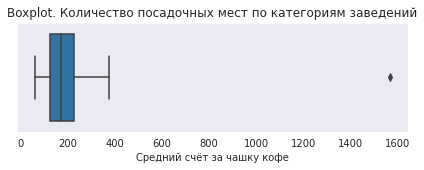

In [55]:
# Построим boxplot

plt.figure(figsize=(7, 2))
ax = sns.boxplot(data=data_cafe, x='middle_coffee_cup')

plt.title('Boxplot. Количество посадочных мест по категориям заведений')
plt.xlabel('Cредний счёт за чашку кофе')
plt.show()

In [56]:
# Аномальное значение действительно существует, поэтому рассчитаем медианную стоимость чашки капучино. 
# стоит ориентироваться при открытии и почему?

bill_coffee = data_cafe.groupby('district').agg({'middle_coffee_cup' : 'median'}).sort_values(by='middle_coffee_cup', ascending=False)\
.round(2).reset_index()
bill_coffee = bill_coffee.rename(columns={'middle_coffee_cup':'bill_coffee_avg'})
bill_coffee

,district,bill_coffee_avg
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


In [57]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=bill_coffee,
    columns=['district', 'bill_coffee_avg'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Средняя стоимость чашки кофе в кофейне по районам Москвы',
).add_to(m)

# выводим карту
m

In [58]:
# Рассчитаем среднюю стоимость чашки кофе по Москве

bill_coffee_avg = bill_coffee['bill_coffee_avg'].mean().round()
print(f'Средняя стоимость чашки кофе по Москве составляет {bill_coffee_avg} руб.')

Средняя стоимость чашки кофе по Москве составляет 166.0 руб.


Средняя стоимость чашки кофе отличается в разных районах Москвы. В Западном, Центральном и Юго-Западном округах стоимость наиболее высока и составляет 189 - 198 руб. А самая низкая стоимость в Восточном административном округе  135 руб.

In [59]:
# Рассчитаем также медианный счёт для кфовеин по Москве

bill_cafe = data_cafe.groupby('district').agg({'middle_avg_bill' : 'median'}).sort_values(by='middle_avg_bill', ascending=False)\
.round(2).reset_index()
bill_cafe = bill_cafe.rename(columns={'middle_avg_bill':'bill_median'})
bill_cafe

,district,bill_median
0,Западный административный округ,600.0
1,Центральный административный округ,500.0
2,Восточный административный округ,400.0
3,Южный административный округ,387.5
4,Юго-Западный административный округ,375.0
5,Северный административный округ,325.0
6,Северо-Восточный административный округ,325.0
7,Северо-Западный административный округ,325.0
8,Юго-Восточный административный округ,250.0


In [60]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=bill_cafe,
    columns=['district', 'bill_median'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Средний счёт в кофейне по районам Москвы',
).add_to(m)

# выводим карту
m

In [61]:
# Рассчитаем среднюю стоимость чашки кофе по Москве

bill_coffee_avg = bill_cafe['bill_median'].mean().round()
print(f'Средний счёт в кофейне по Москве составляет {bill_coffee_avg} руб.')

Средний счёт в кофейне по Москве составляет 388.0 руб.


Средний счёт в кофейне также зависит от района Москвы. Самый высокий средний счёт в Западном округе составит 600 руб., а самый низкий - в Юго-Восточном административном округе  250 руб.

<a id="шаг4.1"></a>
**Шаг 4.1 Вывод**

- общее количество кофеен в датасете 1413
- больше всего кофеен 428 расположено в Центральном округе, далее следуют Северный, Северо-Востоный и Западный округа
- на МКАДе кофейни практически не встречаются
- в датасете 59 круглосуточных кофеин что составляет 4.2  % от общего числа кофеин
- рейтинг кофеен по Москве различается незначительно и составляет 4.2 - 4.3  
- наиболее высокий рейтинг имеют кофейни, расположенные в Центральном и Северо-Западном округе
- наиболее низкие рейтинги у заведений в Северо-Восточном и Западном округах
- средняя стоимость чашки кофе отличается в разных районах Москвы. В Западном, Центральном и Юго-Западном округах стоимость наиболее высока и составляет 189 - 198 руб. А самая низкая стоимость в Восточном административном округе  135 руб.
- средняя стоимость чашки кофе по Москве составляет 166.0 руб.
- средний счёт в кофейне также зависит от района Москвы. Самый высокий средний счёт в Западном округе составит 600 руб., а самый низкий - в Юго-Восточном административном округе  250 руб.
- средний счёт в кафейне по Москве составляет 388.0 руб.


<a id="шаг4.2"></a>
**Шаг 4.2 Рекомендации по открытию кофейни**

При открытии кофейни выбор района Москвы имеет важное значение. 
Так как основатели фонда «Shut Up and Take My Money» планируют открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве, и не боятся конкуренции в этой сфере,то предпочтительнее выбирать Центральный или Юго-Западный район. В этих районах  находится много высших учебных заведений, то есть много потенциальных клиентов. 
Рассмотрим преимущества Юго-западного района. Здесь располагается не так много кофеен 98 из 1413, то есть конкуренция не очень велика.  
Кофейни в данном районе имеют средний рейтинг 4.23 (максимальный рейтинг у кофеин 4.34), то есть есть к чему стремиться.
Средняя стоимость чашки кофе, правда, самая высокая в данном районе - 198 руб. Но средний счёт составляет 375 руб, что вполне доступно для потенциальных клиентов.

Презентация: <file:///C:/Users/Olga.Tolchinskaya/Desktop/%D0%98%D1%81%D1%81%D0%BB%D0%B5%D0%B4%D0%BE%D0%B2%D0%B0%D0%BD%D0%B8%D0%B5%20%D1%80%D1%8B%D0%BD%D0%BA%D0%B0%20%D0%B7%D0%B0%D0%B2%D0%B5%D0%B4%D0%B5%D0%BD%D0%B8%D0%B9%20%D0%BE%D0%B1%D1%89%D0%B5%D1%81%D1%82%D0%B2%D0%B5%D0%BD%D0%BD%D0%BE%D0%B3%D0%BE%20%D0%BF%D0%B8%D1%82%D0%B0%D0%BD%D0%B8%D1%8F%20%D0%B2%20%D0%9C%D0%BE%D1%81%D0%BA%D0%B2%D0%B5_250123.pdf>

<div class="alert alert-danger">
<b>Комментарий ревьюера: ❌</b>

<s>Ссылка на презентацию нужна, на любой открытый диск - гугл, яндекс и тд.
    
Добавь пожалуйста её, чтобы я смог проверить её и написать финальный комментарий.
    
</div>

Презентация: <https://drive.google.com/file/d/1JdS2rbk-Wj0Hz7_-8XFjXw2DQj4ciod7/view?usp=share_link>

<div class="alert alert-info"> <b>Комментарий студента: ℹ️</b> Ссылку добавила </div>

<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

В целом работа очень хорошая. Использовано достаточно большое количество информации, которое складывается в одну общую картинку.
    
На самом деле, там где мы используем повторяющиеся действия по построениям графиков, то есть однотипные графики, рекомендую создавать функции, чтобы не писать один и тот же код несколько раз. Тем самым сможем автоматизировать и оптимизировать свой проект.
    
---
    
    
Презентация сделана хорошо, особенно порадовало:
    
- её структурность
- наличие общих выводов и рекомендаций
- выводы для всех графиков
- последовательность
- стиль
- файл в формате .pdf
    
Как её можно было бы ещё улучшить:
    
    
- добавить цель самого исследования на втором слайде
- пронумеровать слайды
- сделать оглавление

    

    

</div>

<div class="alert alert-success">
<b>Комментарий ревьюера (2): ✅</b>

Рад, что в целом все понятно и особенно здорово, что сразу применяешь новые знания на практике, ведь так они гораздо быстрее усвоятся. Тогда предлагаю двигаться дальше.
    
Поздравляю с успешным завершением проекта 😊👍
    
И желаю успехов в новых работах 😊
    
---
    
Если вдруг у тебя возникнут какие-то вопросы, обязательно напиши их через куратора и я вернусь с ответами.

    
</div>